In [21]:
using Revise
includet("src/utils.jl")
includet("src/sources.jl")
using .utils
using .sources

In [22]:
using ModelingToolkit, OrdinaryDiffEq
using ModelingToolkit: t_nounits as t, D_nounits as D
using ModelingToolkitStandardLibrary.Thermal
using CoolProp.CoolProp
using Plots

In [23]:
function c_stainless_steel_low_T(T)

    a = 12.2486
    b = -80.6422
    c = 218.743
    d = -308.854
    e = 239.5296
    f = -89.9982
    g = 3.15315
    h = 8.44996
    i = -1.91368

    x = log10(T)
    c_out = 10.0^(a + b*x + c*x^2 + d*x^3 + e*x^4 + f*x^5 + g*x^6 + h*x^7 + i*x^8)

    return c_out
end;

In [24]:
@mtkmodel Volume begin
    @parameters begin
        V
        h_init
        p_init
    end

    @components begin
        fluid_outlet = FluidPort()
        heat_port = HeatPort()
    end

    begin
        fluid_model = fluid_outlet.fluid_model
        state_init = calc_fluid_state(h_init, p_init, "HmassP_INPUTS", fluid_model)
        ρ_init = calc_fluid_property("D", state_init)
        u_init = h_init - p_init/ρ_init
    end

    @variables begin
        h(t)
        p(t)
        ρ(t) = ρ_init
        u(t) = u_init
        m(t)
        T(t)
        dp_dT(t)
        Cv(t)
        Q̇(t) = 0.0
        fluid_state(t)
    end

    @equations begin
        # Conservation of mass
        D(m) ~ fluid_outlet.ṁ
        ρ ~ m/V

        # Conservation of energy
        D(u) ~ (fluid_outlet.ṁ*h - u*D(m))/m

        # State properties
        fluid_state ~ calc_fluid_state(ρ, u, "DmassUmass_INPUTS", fluid_model)
        p ~ calc_fluid_property("P", fluid_state)
        T ~ calc_fluid_property("T", fluid_state)
        h ~ u + p/ρ

        ## port connections
        # Fluid port
        fluid_outlet.h ~ h
        fluid_outlet.p ~ p

        # Heat port
        heat_port.Q_flow ~ Q̇
        heat_port.T ~ T
    end
end;

In [25]:
@mtkmodel TankSystem begin
    @structural_parameters begin
        fluid_model
    end

    @parameters begin
        V
        h_init
        p_init
        ṁ
        m_liner
        c_liner
        Q̇_leak
        G_h2_liner
    end

    @components begin
        # Fluid
        properties = FluidProperties(fluid_model=convert(Int32, fluid_model))
        volume = Volume(V=V, h_init=h_init, p_init=p_init)
        massflow = Massflow(ṁ=ṁ)
        sink = Sink()

        # Thermal
        collector = ThermalCollector(m=2)
        conductor = ThermalConductor(G=G_h2_liner)
        liner = HeatCapacitor(C=m_liner*c_liner)
        heat_leak = FixedHeatFlow(Q_flow=Q̇_leak)
    end

    @equations begin
        # Fluid
        connect(properties, volume.fluid_outlet)
        connect(volume.fluid_outlet, massflow.inlet)
        connect(massflow.outlet, sink.inlet)
        
        # Thermal
        connect(volume.heat_port, collector.port_a1)        
        connect(liner.port, conductor.port_a)
        connect(conductor.port_b, collector.port_a2)
        connect(collector.port_b, heat_leak.port)
    end
end;

In [26]:
## Inputs
# Fluid parameters
fluid_name = "ParaHydrogen"
eos = "HEOS"
fluid_model = AbstractState_factory(eos, fluid_name)
ṁ = -10e-3                 # kg/s
T_init = 28               # K
p_init = 16e5            # Pa

# Tank parameters
V_tank = 0.5        # m^3
m_liner = 300       # kg
Q̇_leak = 5          # W
G_h2_liner = 1e6
p_control = 6e5;

In [ ]:
# Derived Inputs
h_init = PropsSI("H", "T", T_init, "P", p_init, fluid_name)
T_control = PropsSI("T", "Q", 1.0, "P", p_control, fluid_name)
c_liner = c_stainless_steel_low_T(T_control);

25.491844214007084

In [28]:
@mtkbuild sys = TankSystem(; V=V_tank, h_init=h_init, p_init=p_init, ṁ=ṁ, fluid_model=fluid_model,
                            m_liner=m_liner, c_liner=c_liner, G_h2_liner=G_h2_liner, Q̇_leak=Q̇_leak)

┌ Warning: fluid_outlet contains 1 flow variables, yet 2 regular (non-flow, non-stream, non-input, non-output) variables. This could lead to imbalanced model that are difficult to debug. Consider marking some of the regular variables as input/output variables.
└ @ ModelingToolkit C:\Users\matth\.julia\packages\ModelingToolkit\Ljerk\src\systems\connectors.jl:54
┌ Warning: inlet contains 1 flow variables, yet 2 regular (non-flow, non-stream, non-input, non-output) variables. This could lead to imbalanced model that are difficult to debug. Consider marking some of the regular variables as input/output variables.
└ @ ModelingToolkit C:\Users\matth\.julia\packages\ModelingToolkit\Ljerk\src\systems\connectors.jl:54
┌ Warning: outlet contains 1 flow variables, yet 2 regular (non-flow, non-stream, non-input, non-output) variables. This could lead to imbalanced model that are difficult to debug. Consider marking some of the regular variables as input/output variables.
└ @ ModelingToolkit C:\Use

Model sys:
Equations (3):
  3 standard: see equations(sys)
Unknowns (3): see unknowns(sys)
  volume₊m(t)
  volume₊u(t) [defaults to volume₊h_init + (-volume₊p_init) / calc_fluid_property(D, calc_fluid_state(volume₊h_init, volume₊p_init, HmassP_INPUTS, volume₊fluid_outlet₊fluid_model))]
  liner₊T(t)
Parameters (38): see parameters(sys)
  collector₊port_a1₊Q_flow_guess [defaults to 0.0]
  c_liner [defaults to 25.4918]
  m_liner [defaults to 300]
  conductor₊port_b₊Q_flow_guess [defaults to 0.0]
  liner₊C [defaults to c_liner*m_liner]: Heat capacity of element
  ṁ [defaults to -0.01]
  ⋮
Observed (38): see observed(sys)

In [29]:
prob = ODEProblem(sys, [], (0, 2000.0));

In [30]:
sol = solve(prob, Tsit5(), dtmax=10.0);

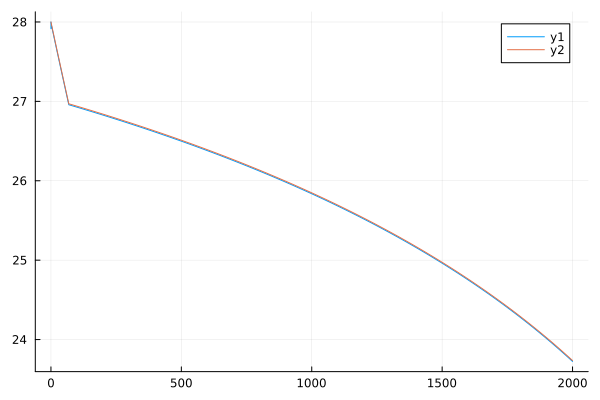

In [31]:
plot(sol.t, sol[sys.liner.T])
plot!(sol.t, sol[sys.volume.T])

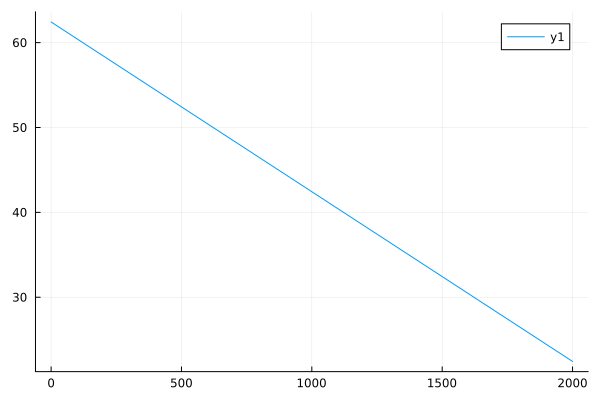

In [32]:
plot(sol.t, sol[sys.volume.ρ])

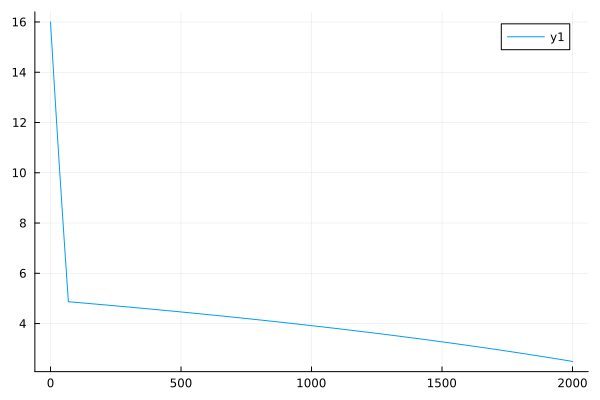

In [33]:
plot(sol.t, sol[sys.volume.p]/1e5)

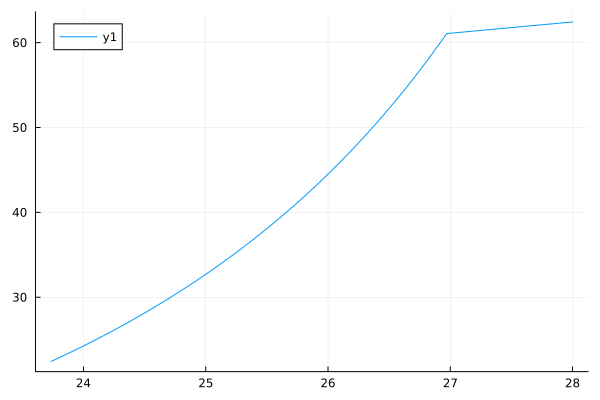

In [34]:
plot(sol[sys.volume.T], sol[sys.volume.ρ])